In [1]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread,imsave
from scipy.signal import convolve, convolve2d
import cv2
from tqdm import tqdm

# Guided Filter

In [2]:
############################# imports ################################
import numpy as np
from scipy.signal import convolve2d
from skimage.io import imread
import matplotlib.pyplot as plt

########################### utilities functions #####################


def to_32F(image):
    if image.max() > 1.0:
        image = image / 255.0
    return np.clip(np.float32(image), 0, 1)

def filtre_lineaire(im,mask):
    """ renvoie la convolution de l'image avec le mask. Le calcul se fait en
    utilisant la transformee de Fourier et est donc circulaire.  Fonctionne seulement pour
    les images en niveau de gris.
    """
    fft2=np.fft.fft2
    ifft2=np.fft.ifft2
    (y,x)=im.shape
    (ym,xm)=mask.shape
    mm=np.zeros((y,x))
    mm[:ym,:xm]=mask
    fout=(fft2(im)*fft2(mm))
    # on fait une translation pour ne pas avoir de decalage de l'image
    # pour un mask de taille impair ce sera parfait, sinon, il y a toujours un decalage de 1/2
    mm[:ym,:xm]=0
    y2=int(np.round(ym/2-0.5))
    x2=int(np.round(xm/2-0.5))
    mm[y2,x2]=1
    out=np.real(ifft2(fout*np.conj(fft2(mm))))
    return out


def apply_avrage_filter (im,raduis):
    mask = np.ones((2*raduis+1,2*raduis+1))
    mask = mask/mask.sum()
   # return convolve2d(im,mask,mode="same",boundary='symm')
    return filtre_lineaire(im,mask)

def compute_coveriance (x1,x2,r):
    avg_x1=apply_avrage_filter(x1,r)
    avg_x2=apply_avrage_filter(x2,r)
    avg_x1_x2=apply_avrage_filter(x1*x2,r)
    return avg_x1_x2 -avg_x1*avg_x2

In [3]:
def guided_filter_gray (I,P,r,ep):
    #make sure that the images I and P have one single channel

    assert (len(I.shape) == 2)  and( len(P.shape) == 2) , 'invalid input, please give a gray image'

    P_I = I*P
    avg_I= apply_avrage_filter(I,r)
    avg_P= apply_avrage_filter(P,r)
    var_I= apply_avrage_filter(I*I,r)-avg_I**2
    #var_P= apply_average_filter()
    a_k = (apply_avrage_filter(P_I,r)-avg_I*avg_P) /(var_I+ep)
    b_k = avg_P-a_k*avg_I

    avg_a_k= apply_avrage_filter(a_k,r)
    avg_b_k= apply_avrage_filter(b_k,r)

    out = avg_a_k*I+avg_b_k
    return out


def guided_filter_guidance_color(I,P,r,ep):

    #make sure that the guidance image is a color image and the input is one channel
    assert (len(I.shape) == 3) and( I.shape[2] == 3) and (len(P.shape) == 2)  , 'invalid input, please give a color guidance image and a gray input'
    image_shape = I.shape



    # Compute left side
    cov_matrix = np.zeros((I.shape[0],I.shape[1],3,3))
    for i in range (3):
        for j in range (3):
            cov_matrix[:,:,i,j] = compute_coveriance (I[:,:,i],I[:,:,j],r)

    U = np.tile(np.identity(3), (image_shape[0], image_shape[1], 1, 1))
    left = np.linalg.inv(cov_matrix + ep*U)


    #Compute right side
    avg_P  = apply_avrage_filter(P,r)
    avg_I = np.zeros_like(I)
    avg_I_P = np.zeros_like(I)
    reshaped_P = np.tile(P[:, :, np.newaxis], (1, 1, 3))
    I_P = I*reshaped_P
    for i in range(3):
        avg_I [:,:,i] = apply_avrage_filter(I[:,:,i],r)
        avg_I_P[:,:,i]= apply_avrage_filter(I_P[:,:,i],r)


    right = (avg_I_P - avg_I*np.tile(avg_P[:, :, np.newaxis], (1,  1, 3))) [:, :, :,np.newaxis]
    a_k = (left@right).reshape(image.shape)

    #b_k = avg_P - (a_k*avg_I).sum(axis=2)
    b_k = avg_P - (a_k[:,:,0] * avg_I[:,:,0]+a_k[:,:,1] * avg_I[:,:,1]+a_k[:,:,2] * avg_I[:,:,2])

    avg_a_k = np.zeros_like(I)
    #avg_a_k =
    avg_b_k =  apply_avrage_filter(b_k,r)
    for i in range(3):
        avg_a_k [:,:,i] = apply_avrage_filter(a_k[:,:,i],r)


    out = avg_b_k+ (avg_a_k[:,:,0]*I[:,:,0]+avg_a_k[:,:,1]*I[:,:,1]+avg_a_k[:,:,2]*I[:,:,2])
    return out #,avg_I,avg_P,left,right,a_k,b_k,avg_a_k,avg_b_k,cov_matrix

# the generalized guided filter function to be called
def guided_filter (I,P,r,ep) :
    # first we normalize the input
    I = to_32F(I)
    P = to_32F(P)

    #then we distinguish the case where P is gray and when p is color (3channels )
    if(len(P.shape)==2) :  # case gray input image
        if(len(I.shape)==2) :   # case gray guidance image
            return guided_filter_gray (I,P,r,ep)
        elif (len(I.shape)==3): # case color guidance image with gray input
             return guided_filter_guidance_color(I,P,r,ep)
    elif (len(P.shape) == 3):  # case color input
        # first we extract each channel

        P_red,P_green,P_bleu = P[:,:,0],P[:,:,1],P[:,:,2]
        out = np.zeros_like(P)
        if(len(I.shape) == 2):  # case gray guidance
            out[:,:,0]=guided_filter_gray (I,P[:,:,0],r,ep)
            out[:,:,1]=guided_filter_gray (I,P[:,:,1],r,ep)
            out[:,:,2]=guided_filter_gray (I,P[:,:,2],r,ep)
            return out
        elif(len(I.shape)==3): # case color guidance image
            out[:,:,0]=guided_filter_guidance_color (I,P[:,:,0],r,ep)
            out[:,:,1]=guided_filter_guidance_color(I,P[:,:,1],r,ep)
            out[:,:,2]=guided_filter_guidance_color(I,P[:,:,2],r,ep)
            return out
    else :
        raise ValueError("Input images must be either one channel for gray images or 3 channels for color images")



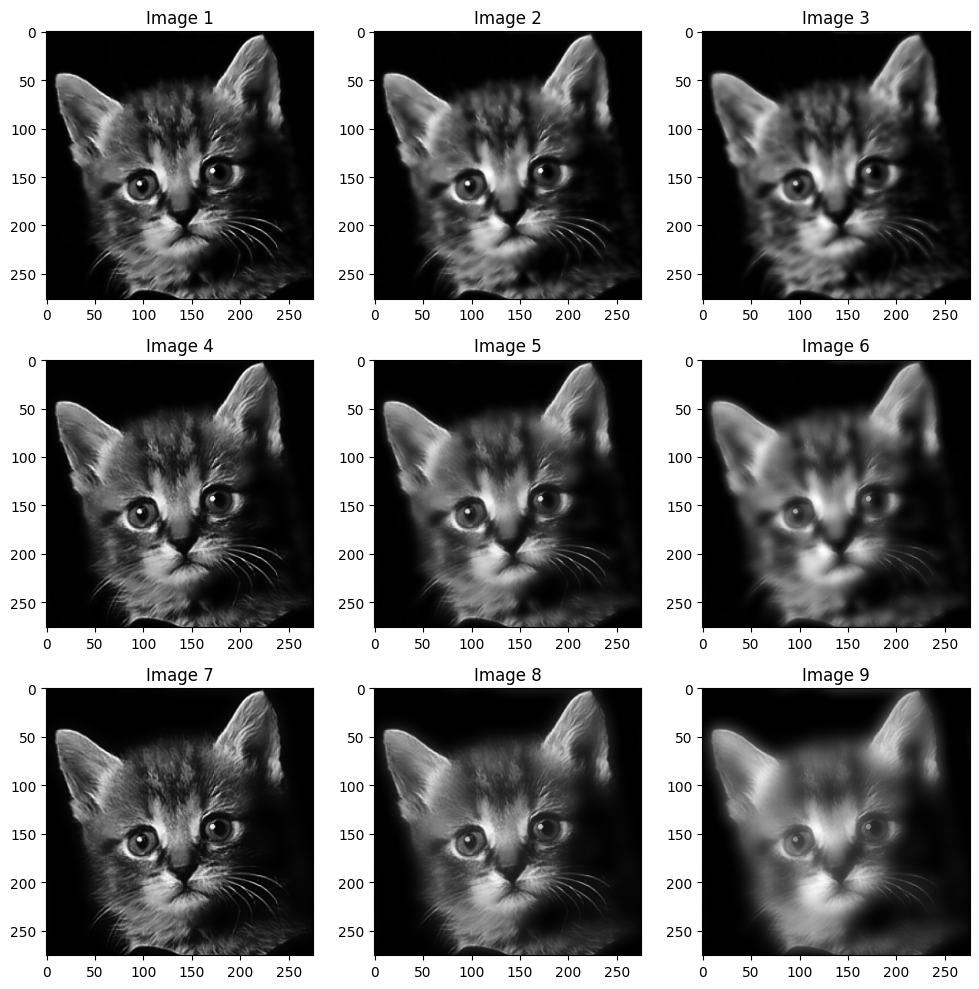

In [ ]:
#### example of usage :
image=imread("/content/cat.png")
GF1 = guided_filter(image,image,7, 0.3)


images = []

images.append(guided_filter(image,image,2, 0.01))
images.append(guided_filter(image,image,2, 0.2**2))
images.append(guided_filter(image,image,2, 0.4**2))

images.append(guided_filter(image,image,4, 0.01))
images.append(guided_filter(image,image,4, 0.2**2))
images.append(guided_filter(image,image,4, 0.4**2))

images.append(guided_filter(image,image,8, 0.01))
images.append(guided_filter(image,image,8, 0.2**2))
images.append(guided_filter(image,image,8, 0.4**2))



fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i in range(3):
    for j in range(3):
        ax = axes[i, j]
        if i * 3 + j < len(images):
            ax.imshow(images[i * 3 + j],cmap='gray')
            ax.set_title(f'Image {i * 3 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()
# Show the plot
plt.show()



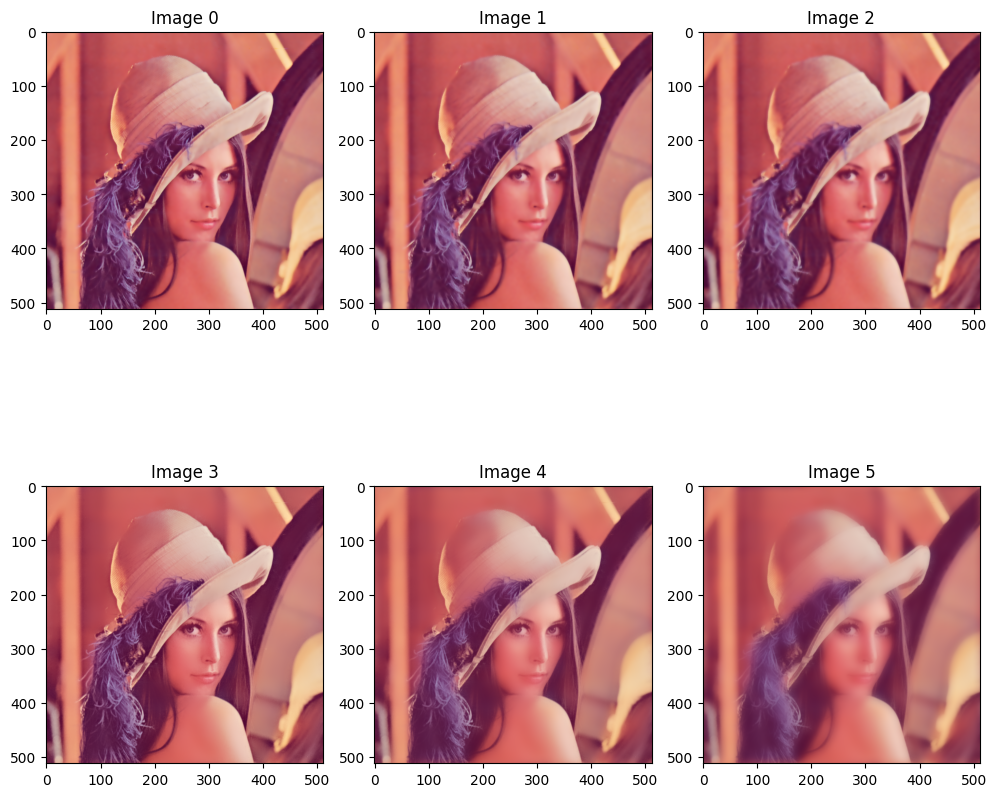

In [ ]:
image=imread("/content/Lina.png")

images =[]

images.append(guided_filter(image,image,2, 0.01))
images.append(guided_filter(image,image,2, 0.2**2))
images.append(guided_filter(image,image,2, 0.4**2))


images.append(guided_filter(image,image,8, 0.01))
images.append(guided_filter(image,image,8, 0.2**2))
images.append(guided_filter(image,image,8, 0.4**2))


## affichage des images
fig, axes = plt.subplots(2, 3, figsize=(10, 10))

for i in range(2):
    for j in range(3):
        ax = axes[i, j]
        if i * 3 + j < len(images):
            ax.imshow(images[i * 3 + j],cmap='gray')
            ax.set_title(f'Image {3*i+j}')

# Adjust spacing between subplots
plt.tight_layout()
# Show the plot
plt.show()

In [4]:
def guided_filter_fusion(im1, im2, r_1=45, r_2=7, eps_1=0.3, eps_2=1e-6):
    # kernels
    laplace_kernel = np.array([[0,1,0],
                          [1,-4,1],
                          [0,1,0]])

    r = 5
    s = 5
    ss= 2*r + 1
    ms=(ss-1)//2
    X=np.arange(-ms,ms+0.99)
    y=np.exp(-X**2/2/s**2)
    out=y.reshape((ss,1))@y.reshape((1,ss))
    gaussian_kernel = out/out.sum()

    # Split channels
    im1_red, im1_green, im1_blue = im1[:,:,0], im1[:,:,1], im1[:,:,2]
    im2_red, im2_green, im2_blue = im2[:,:,0], im2[:,:,1], im2[:,:,2]

    # Average filtering
    B1_red, B1_green, B1_blue = apply_avrage_filter(im1_red, 15), apply_avrage_filter(im1_green, 15), apply_avrage_filter(im1_blue, 15)
    B2_red, B2_green, B2_blue = apply_avrage_filter(im2_red, 15), apply_avrage_filter(im2_green, 15), apply_avrage_filter(im2_blue, 15)
    B1 = np.stack([B1_red, B1_green, B1_blue], axis=-1)
    B2 = np.stack([B2_red, B2_green, B2_blue], axis=-1)
    D1 = im1 - B1
    D2 = im2 - B2

    # Saliency measure
    H1_red = convolve2d(im1_red, laplace_kernel, mode='same', boundary="fill")
    H1_green = convolve2d(im1_green, laplace_kernel, mode='same', boundary="fill")
    H1_blue = convolve2d(im1_blue, laplace_kernel, mode='same', boundary="fill")
    H1 = np.stack([H1_red, H1_green, H1_blue], axis=-1)
    S1 = convolve2d(np.linalg.norm(H1, axis=2), gaussian_kernel, mode='same', boundary="fill")

    H2_red = convolve2d(im2_red, laplace_kernel, mode='same', boundary="fill")
    H2_green = convolve2d(im2_green, laplace_kernel, mode='same', boundary="fill")
    H2_blue = convolve2d(im2_blue, laplace_kernel, mode='same', boundary="fill")
    H2 = np.stack([H2_red, H2_green, H2_blue], axis=-1)
    S2 = convolve2d(np.linalg.norm(H1, axis=2), gaussian_kernel, mode='same', boundary="fill")

    # Saliency comparison
    mask = np.uint8(np.argmax([S1, S2], axis=0))

    P1 = np.zeros_like(S1)
    P2 = np.zeros_like(S2)

    P1[mask==1] = 1.
    P2[mask==0] = 1.

    # Guided filtering
    W1_B = guided_filter(P1, im1, r_1, eps_1)
    W2_B = guided_filter(P2, im2, r_2, eps_2)
    W1_D = guided_filter(P1, im1, r_2, eps_2)
    W2_D = guided_filter(P2, im2, r_2, eps_2)

    # Reconstraction
    B_hat = (W1_B*B1 + W2_B*B2) / (W1_B + W2_B)
    D_hat = (W1_D*D1 + W2_D*D2) / (W2_D + W2_D)

    F = B_hat + D_hat
    return (F - F.min()) / (F.max() - F.min())


In [ ]:
imsave("/content/result1.jpg",(guided_filter_fusion(ima1,ima2) * 255).astype(np.uint8))

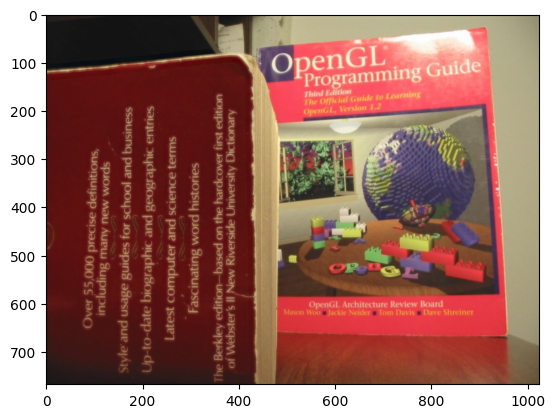

In [ ]:
plt.imshow(guided_filter_fusion(ima1,ima2))

In [ ]:
# Load images
im1 = imread(r"images/sbug00.png")
im2 = imread(r"images/sbug01.png")
im3 = imread(r"images/sbug02.png")

In [ ]:
fus = guided_filter_fusion(im1, im2)
fus = guided_filter_fusion(fus, im3)

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

axes[0,0].imshow(im1)
axes[0,0].set_title("Image 1")

axes[0,1].imshow(im2)
axes[0,1].set_title("Image 2")

axes[1,0].imshow(im3)
axes[1,0].set_title("Image 3")

axes[1,1].imshow(fus)
axes[1,1].set_title("Fused Image")

plt.tight_layout()
plt.show()

In [ ]:
# Load images
im1 = imread(r"/content/book1.jpg")
im2 = imread(r"/content/book2.jpg")

#fus = guided_filter_fusion(im1, im2)

fig, axes = plt.subplots(2, 2, figsize=(20, 20))

axes[0,0].imshow(im1)
axes[0,0].set_title("Image 1")

axes[0,1].imshow(im2)
axes[0,1].set_title("Image 2")

axes[1,0].imshow(fus)
axes[1,0].set_title("fusion")

plt.tight_layout()
plt.show()

# **Guided Filter Fusion**

In [5]:
# Imports
import numpy as np
from scipy.signal import convolve, convolve2d

import matplotlib.pyplot as plt
from skimage.io import imread

In [6]:
def to_32F(image):
    if image.max() > 1.0:
        image = image / 255.0
    return np.clip(np.float32(image), 0, 1)

In [7]:
def box_filter(imSrc, r):

    hei, wid = imSrc.shape
    imDst = np.zeros_like(imSrc, dtype=float)

    # cumulative sum over Y axis
    imCum = np.cumsum(imSrc, axis=0)

    # difference over Y axis
    imDst[0:r+1, :] = imCum[0+r:2*r+1, :]
    imDst[r+1:hei-r, :] = imCum[2*r+1:hei, :] - imCum[0:hei-2*r-1, :]
    imDst[hei-r:hei, :] = imCum[hei-1, :] - imCum[hei-2*r-1:hei-r-1, :]

    # cumulative sum over X axis
    imCum = np.cumsum(imDst, axis=1)

    # difference over X axis
    imDst[:, 0:r+1] = imCum[:, 0+r:2*r+1]
    imDst[:, r+1:wid-r] = imCum[:, 2*r+1:wid] - imCum[:, 0:wid-2*r-1]
    imDst[:, wid-r:wid] = imCum[:, wid-1].reshape(hei,1) - imCum[:, wid-2*r-1:wid-r-1]

    return imDst


In [8]:
def box_filter_3D(imSrc, r):

  hei, wid, chn = imSrc.shape
  imDst = np.zeros_like(imSrc, dtype=float)

  # cumulative sum over Y axis
  imCum = np.cumsum(imSrc, axis=0)

  # difference over Y axis
  imDst[0:r+1, :, :] = imCum[0+r:2*r+1, :, :]
  imDst[r+1:hei-r, :, :] = imCum[2*r+1:hei, :, :] - imCum[0:hei-2*r-1, :, :]
  imDst[hei-r:hei, :, :] = imCum[hei-1, :, :] - imCum[hei-2*r-1:hei-r-1, :, :]

  # cumulative sum over X axis
  imCum = np.cumsum(imDst, axis=1)

  # difference over X axis
  imDst[:, 0:r+1, :] = imCum[:, 0+r:2*r+1, :]
  imDst[:, r+1:wid-r, :] = imCum[:, 2*r+1:wid, :] - imCum[:, 0:wid-2*r-1, :]
  imDst[:, wid-r:wid, :] = imCum[:, wid-1, :].reshape(hei,1, chn) - imCum[:, wid-2*r-1:wid-r-1, :]

  return imDst


In [9]:
def guided_filter_gray(I, P, r, eps):

    hei, wid = I.shape
    N = box_filter(np.ones((hei, wid)), r)

    mean_I = box_filter(I, r) / N
    mean_P = box_filter(P, r) / N
    mean_IP = box_filter(I * P, r) / N
    cov_IP = mean_IP - mean_I * mean_P

    mean_II = box_filter(I * I, r) / N
    var_I = mean_II - mean_I * mean_I

    a = cov_IP / (var_I + eps)
    b = mean_P - a * mean_I

    mean_a = box_filter(a, r) / N
    mean_b = box_filter(b, r) / N

    return np.clip(mean_a * I + mean_b, 0, 1)


In [10]:
def guided_filter_color(I, P, r, eps):

    hei, wid, _ = I.shape
    N = box_filter(np.ones((hei, wid)), r)

    mean_IP = box_filter_3D(I*np.expand_dims(P, axis=2), r) / np.expand_dims(N, axis=2)
    mean_I = box_filter_3D(I, r) / np.expand_dims(N, axis=2)
    mean_P = box_filter(P, r) / N

    Cov_IP = mean_IP - np.expand_dims(mean_P, axis=2) * mean_I

    # Notez que la variance dans chaque patch local est une matrice symétrique 3x3 :
    #           rr, rg, rb
    #   Sigma = rg, gg, gb
    #           rb, gb, bb

    sigma = np.zeros((hei, wid, 3, 3))

    var_I_rr = box_filter(I[:, :, 0] * I[:, :, 0], r) / N - mean_I[:,:,0] * mean_I[:,:,0]
    var_I_rg = box_filter(I[:, :, 0] * I[:, :, 1], r) / N - mean_I[:,:,0] * mean_I[:,:,1]
    var_I_rb = box_filter(I[:, :, 0] * I[:, :, 2], r) / N - mean_I[:,:,0] * mean_I[:,:,2]
    var_I_gg = box_filter(I[:, :, 1] * I[:, :, 1], r) / N - mean_I[:,:,1] * mean_I[:,:,1]
    var_I_gb = box_filter(I[:, :, 1] * I[:, :, 2], r) / N - mean_I[:,:,1] * mean_I[:,:,2]
    var_I_bb = box_filter(I[:, :, 2] * I[:, :, 2], r) / N - mean_I[:,:,2] * mean_I[:,:,2]

    sigma[:,:,0,0] = var_I_rr
    sigma[:,:,1,1] = var_I_gg
    sigma[:,:,2,2] = var_I_bb
    sigma[:,:,0,1], sigma[:,:,1,0] = var_I_rg, var_I_rg
    sigma[:,:,0,2], sigma[:,:,2,0] = var_I_rb, var_I_rb
    sigma[:,:,1,2], sigma[:,:,2,1] = var_I_gb, var_I_gb


    a = (np.linalg.inv(sigma + eps*np.tile(np.eye(3), (hei,wid,1,1))) @ np.expand_dims(Cov_IP, axis=3)).reshape(hei, wid, 3)
    b = mean_P - np.sum(a*mean_I, axis=2)

    mean_a = box_filter_3D(a, r) / np.expand_dims(N, axis=2)
    mean_b = box_filter(b, r) / N

    return np.clip(np.sum(mean_a*I, axis=2) + mean_b, 0, 1)


In [11]:
def guided_filter(I, P, r, eps) :

    # First we normalize the input
    I = to_32F(I)
    P = to_32F(P)

    # Then we distinguish the case where P is gray and when p is color (3channels )
    if(len(P.shape) == 2) :  # Case gray input image
        if(len(I.shape) == 2) :   # Case gray guidance image
            return guided_filter_gray(I, P, r, eps)
        elif (len(I.shape) == 3): # Case color guidance image with gray input
             return guided_filter_color(I, P, r, eps)
    elif (len(P.shape) == 3):  # case color input
        out = np.zeros_like(P)

        if(len(I.shape) == 2):  # Case gray guidance
            out[:,:,0] = guided_filter_gray(I, P[:,:,0], r, eps)
            out[:,:,1] = guided_filter_gray(I, P[:,:,1], r, eps)
            out[:,:,2] = guided_filter_gray(I, P[:,:,2], r, eps)
            return out
        elif(len(I.shape) == 3): # Case color guidance image
            out[:,:,0] = guided_filter_color(I, P[:,:,0], r, eps)
            out[:,:,1] = guided_filter_color(I, P[:,:,1], r, eps)
            out[:,:,2] = guided_filter_color(I, P[:,:,2], r, eps)
            return out
    else :
        raise ValueError("Input images must be either one channel for gray images or 3 channels for color images")


In [12]:
def guided_filter_fusion_gray(I, r_1=45, r_2=7, eps_1=0.3, eps_2=1e-6):

    h, w = I[0].shape
    n = len(I)
    N = box_filter(np.ones((h,w)), r=15)

    # Normalisation
    I = [to_32F(I_n) for I_n in I]

    # Kernels
    laplace_kernel = np.array([[0,1,0],
                               [1,-4,1],
                               [0,1,0]])

    X = np.arange(-5, 5.99)
    y = np.exp(-X**2 / (2 * 5**2))
    out = y.reshape((11,1)) @ y.reshape((1,11))
    gaussian_kernel = out / out.sum()

    # Average filtering
    B = [box_filter(I_n, 15) / N for I_n in I]
    D = [I[i] - B[i] for i in range(n)]

    # Saliency measure
    S = []
    for I_n in I:
        H_n = convolve2d(I_n, laplace_kernel, mode='same', boundary="fill")
        S.append(convolve2d(abs(H_n), gaussian_kernel, mode='same', boundary="fill"))

    # Saliency comparaison
    mask = np.uint8(np.argmax(S, axis=0))
    P = [np.zeros_like(S[0]) for i in range(n)]
    for i in range(n):
        P[i][mask==i] = 1

    # Guided filtering
    W_B = [guided_filter(I[i], P[i], r_1, eps_1) for i in range(n)]
    W_D = [guided_filter(I[i], P[i], r_2, eps_2) for i in range(n)]

    # Weighted average
    B_hat = sum([W_B[i]*B[i] for i in range(n)]) / sum(W_B)
    D_hat = sum([W_D[i]*D[i] for i in range(n)]) / sum(W_D)

    return np.clip(B_hat + D_hat, 0, 1)

In [13]:
def guided_filter_fusion_color(I, r_1=45, r_2=7, eps_1=0.3, eps_2=1e-6):

    h, w, _ = I[0].shape
    n = len(I)
    N = box_filter(np.ones((h,w)), r=15).reshape(h,w,1)

    # Normalisation
    I = [to_32F(I_n) for I_n in I]

    # Kernels
    laplace_kernel = np.array([[0,1,0],
                               [1,-4,1],
                               [0,1,0]])

    X = np.arange(-5, 5.99)
    y = np.exp(-X**2 / (2 * 5**2))
    out = y.reshape((11,1)) @ y.reshape((1,11))
    gaussian_kernel = out / out.sum()

    # Average filtering
    B = [box_filter_3D(I_n, 15) / N for I_n in I]
    D = [I[i] - B[i] for i in range(n)]

    # Saliency measure
    S = []
    for I_n in I:
        H_n = [convolve2d(I_n[:,:,i], laplace_kernel, mode='same', boundary="fill") for i in range(3)]
        H_n = np.stack(H_n, axis=-1)
        S.append(convolve2d(np.linalg.norm(H_n, axis=2), gaussian_kernel, mode='same', boundary="fill"))

    # Saliency comparaison
    mask = np.uint8(np.argmax(S, axis=0))
    P = [np.zeros_like(S[0]) for i in range(n)]
    for i in range(n):
        P[i][mask==i] = 1

    # Guided filtering
    W_B = [guided_filter(I[i], P[i], r_1, eps_1).reshape(h,w,1) for i in range(n)]
    W_D = [guided_filter(I[i], P[i], r_2, eps_2).reshape(h,w,1) for i in range(n)]

    # Weighted average
    B_hat = sum([W_B[i]*B[i] for i in range(n)]) / sum(W_B)
    D_hat = sum([W_D[i]*D[i] for i in range(n)]) / sum(W_D)

    return np.clip(B_hat + D_hat, 0, 1)


In [14]:
def guided_filter_fusion(I, r_1=45, r_2=7, eps_1=0.3, eps_2=1e-6):

    # Check that all the images have the same shape
    first_shape = I[0].shape
    for e in I[1:]:
        if e.shape != first_shape:
            raise ValueError("All the selected images must have the same shape.")

    # Case grayscale images
    if len(first_shape) == 2:
        return guided_filter_fusion_gray(I, r_1, r_2, eps_1, eps_2)

    # Case color images
    elif len(first_shape) == 3 and first_shape[-1] == 3:
        return guided_filter_fusion_color(I, r_1, r_2, eps_1, eps_2)

    else:
        raise ValueError("Invalid input images.")

In [15]:
import numpy as np
import cv2

def fast_guided_filter_gray(I, p, r, eps, s):
    I_sub = cv2.resize(I, None, fx=1/s, fy=1/s, interpolation=cv2.INTER_NEAREST)
    p_sub = cv2.resize(p, None, fx=1/s, fy=1/s, interpolation=cv2.INTER_NEAREST)
    r_sub = int(r / s)

    hei, wid = I_sub.shape
    N = box_filter(np.ones((hei, wid)), r_sub)  # Size of each local patch
    mean_I = box_filter(I_sub, r_sub) / N
    mean_p = box_filter(p_sub, r_sub) / N
    mean_Ip = box_filter(I_sub * p_sub, r_sub) / N
    cov_Ip = mean_Ip - mean_I * mean_p

    mean_II = box_filter(I_sub * I_sub, r_sub) / N
    var_I = mean_II - mean_I * mean_I

    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    mean_a = box_filter(a, r_sub) / N
    mean_b = box_filter(b, r_sub) / N

    mean_a = cv2.resize(mean_a, (I.shape[1], I.shape[0]), interpolation=cv2.INTER_LINEAR)
    mean_b = cv2.resize(mean_b, (I.shape[1], I.shape[0]), interpolation=cv2.INTER_LINEAR)

    return np.clip(mean_a * I + mean_b, 0, 1)



In [16]:
def fast_guided_filter_color(I, P, r, eps, s):

    I_sub = cv2.resize(I, None, fx=1/s, fy=1/s, interpolation=cv2.INTER_NEAREST)
    P_sub = cv2.resize(P, None, fx=1/s, fy=1/s, interpolation=cv2.INTER_NEAREST)
    r_sub = int(r / s)

    hei, wid, _ = I_sub.shape
    N = box_filter(np.ones((hei, wid)), r_sub)

    mean_IP = box_filter_3D(I_sub*np.expand_dims(P_sub, axis=2), r_sub) / np.expand_dims(N, axis=2)
    mean_I = box_filter_3D(I_sub, r_sub) / np.expand_dims(N, axis=2)
    mean_P = box_filter(P_sub, r_sub) / N

    Cov_IP = mean_IP - np.expand_dims(mean_P, axis=2) * mean_I

    # Notez que la variance dans chaque patch local est une matrice symétrique 3x3 :
    #           rr, rg, rb
    #   Sigma = rg, gg, gb
    #           rb, gb, bb

    sigma = np.zeros((hei, wid, 3, 3))

    var_I_rr = box_filter(I_sub[:, :, 0] * I_sub[:, :, 0], r_sub) / N - mean_I[:,:,0] * mean_I[:,:,0]
    var_I_rg = box_filter(I_sub[:, :, 0] * I_sub[:, :, 1], r_sub) / N - mean_I[:,:,0] * mean_I[:,:,1]
    var_I_rb = box_filter(I_sub[:, :, 0] * I_sub[:, :, 2], r_sub) / N - mean_I[:,:,0] * mean_I[:,:,2]
    var_I_gg = box_filter(I_sub[:, :, 1] * I_sub[:, :, 1], r_sub) / N - mean_I[:,:,1] * mean_I[:,:,1]
    var_I_gb = box_filter(I_sub[:, :, 1] * I_sub[:, :, 2], r_sub) / N - mean_I[:,:,1] * mean_I[:,:,2]
    var_I_bb = box_filter(I_sub[:, :, 2] * I_sub[:, :, 2], r_sub) / N - mean_I[:,:,2] * mean_I[:,:,2]

    sigma[:,:,0,0] = var_I_rr
    sigma[:,:,1,1] = var_I_gg
    sigma[:,:,2,2] = var_I_bb
    sigma[:,:,0,1], sigma[:,:,1,0] = var_I_rg, var_I_rg
    sigma[:,:,0,2], sigma[:,:,2,0] = var_I_rb, var_I_rb
    sigma[:,:,1,2], sigma[:,:,2,1] = var_I_gb, var_I_gb


    a = (np.linalg.inv(sigma + eps*np.tile(np.eye(3), (hei,wid,1,1))) @ np.expand_dims(Cov_IP, axis=3)).reshape(hei, wid, 3)
    b = mean_P - np.sum(a*mean_I, axis=2)

    mean_a = box_filter_3D(a, r_sub) / np.expand_dims(N, axis=2)
    mean_b = box_filter(b, r_sub) / N

    mean_a = cv2.resize(mean_a, (I.shape[1], I.shape[0]), interpolation=cv2.INTER_LINEAR)
    mean_b = cv2.resize(mean_b, (I.shape[1], I.shape[0]), interpolation=cv2.INTER_LINEAR)

    return np.clip(np.sum(mean_a*I, axis=2) + mean_b, 0, 1)


In [17]:
def fast_guided_filter(I, P, r, eps, s) :

    # First we normalize the input
    I = to_32F(I)
    P = to_32F(P)

    # Then we distinguish the case where P is gray and when p is color (3channels )
    if(len(P.shape) == 2) :  # Case gray input image
        if(len(I.shape) == 2) :   # Case gray guidance image
            return fast_guided_filter_gray(I, P, r, eps, s)
        elif (len(I.shape) == 3): # Case color guidance image with gray input
             return fast_guided_filter_color(I, P, r, eps, s)
    elif (len(P.shape) == 3):  # case color input
        out = np.zeros_like(P)

        if(len(I.shape) == 2):  # Case gray guidance
            out[:,:,0] = fast_guided_filter_gray(I, P[:,:,0], r, eps, s)
            out[:,:,1] = fast_guided_filter_gray(I, P[:,:,1], r, eps, s)
            out[:,:,2] = fast_guided_filter_gray(I, P[:,:,2], r, eps, s)
            return out
        elif(len(I.shape) == 3): # Case color guidance image
            out[:,:,0] = fast_guided_filter_color(I, P[:,:,0], r, eps, s)
            out[:,:,1] = fast_guided_filter_color(I, P[:,:,1], r, eps, s)
            out[:,:,2] = fast_guided_filter_color(I, P[:,:,2], r, eps, s)
            return out
    else :
        raise ValueError("Input images must be either one channel for gray images or 3 channels for color images")


In [ ]:
ima1=imread('/content/book1.jpg')
ima2=imread('/content/book2.jpg')
result = guided_filter_fusion((ima1,ima2))


FileNotFoundError: ignored

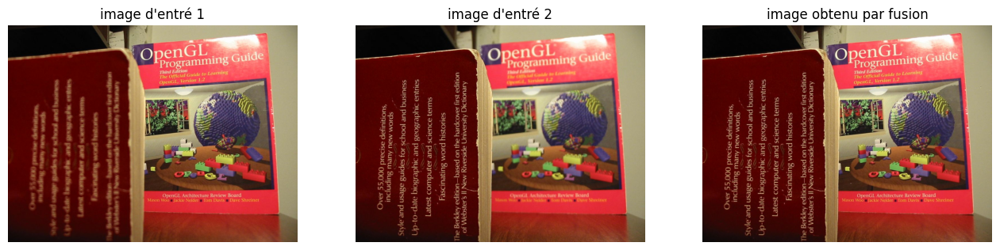

In [ ]:
fig,axes = plt.subplots(1,3,figsize=(16,16))

axes[0].imshow(ima1)
axes[0].set_title("image d'entré 1")
axes[1].imshow(ima2)
axes[1].set_title("image d'entré 2")
axes[2].imshow(result)
axes[2].set_title("image obtenu par fusion")
for i in range (3):
  axes[i].axis("off")

In [18]:
def show_fusion (ima1,ima2):
  #ima1=imread(path1)
  #ima2=imread(path2)

  fig,axes = plt.subplots(1,3,figsize=(16,16))
  result = guided_filter_fusion((ima1,ima2))
  axes[0].imshow(ima1)
  axes[0].set_title("image d'entré 1")
  axes[1].imshow(ima2)
  axes[1].set_title("image d'entré 2")
  axes[2].imshow(result)
  axes[2].set_title("image obtenu par fusion")
  for i in range (3):
    axes[i].axis("off")
  plt.show()

def show_filter (ima1,ima2,r,eps):
  #ima1=imread(path1)
  #ima2=imread(path2)

  fig,axes = plt.subplots(1,3,figsize=(16,16))
  result = guided_filter(ima1,ima2,r,eps)
  axes[0].imshow(ima1)
  axes[0].set_title("image d'entré 1")
  axes[1].imshow(ima2)
  axes[1].set_title("image d'entré 2")
  axes[2].imshow(result)
  axes[2].set_title("image obtenu par fusion")
  for i in range (3):
    axes[i].axis("off")
  plt.show()

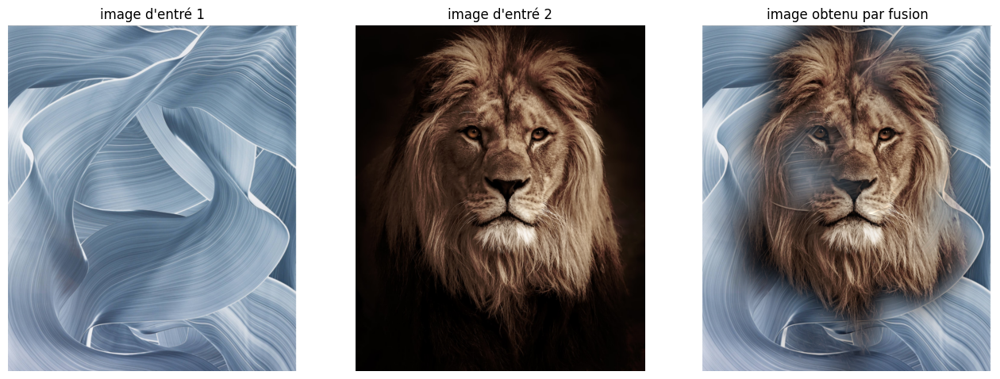

In [ ]:
show_fusion(ima,ima2)

<ipython-input-66-d327a5aad633>:43: RuntimeWarning: invalid value encountered in divide
  D_hat = sum([W_D[i]*D[i] for i in range(n)]) / sum(W_D)


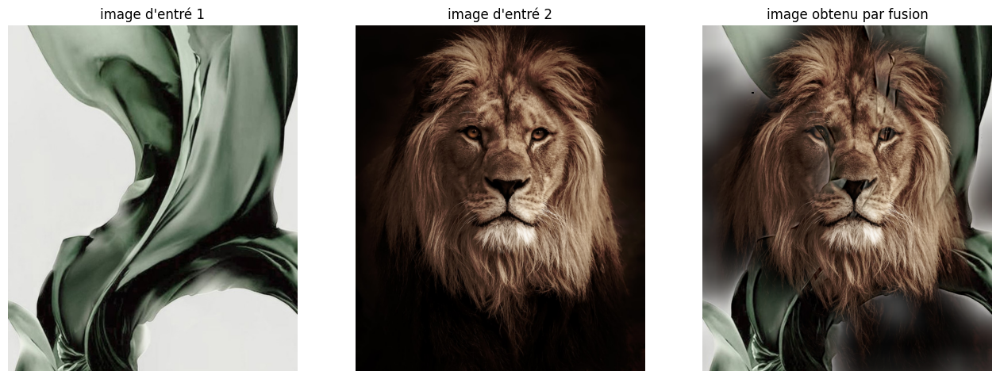

In [ ]:
ima3=imread("/content/téléchargement.jpg")
show_fusion(ima3,ima2)

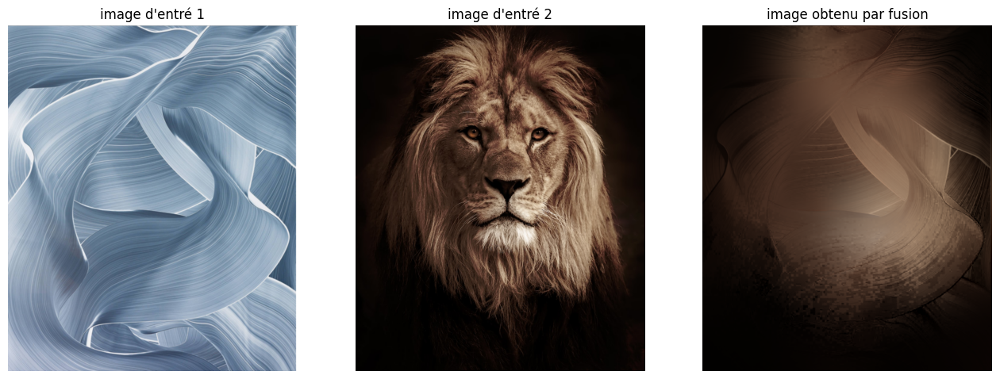

In [ ]:
show_filter(ima,ima2,r=100,eps=0.00000002)

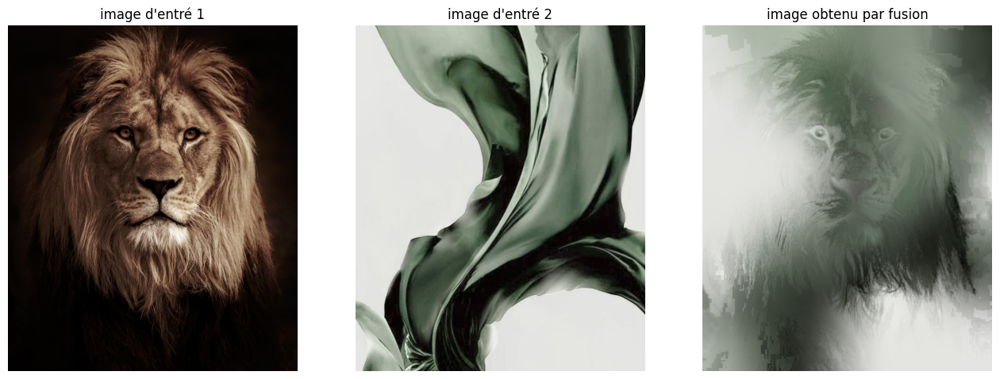

In [ ]:
show_filter(ima2,ima3,r=100,eps=0.00000002)

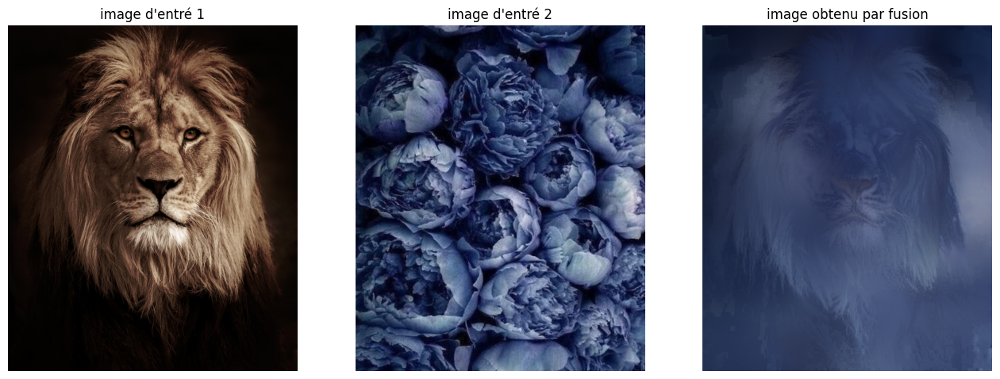

In [ ]:
ima4=imread('/content/téléchargement (1).jpg')
show_filter(ima2,ima4,r=100,eps=0.00000002)

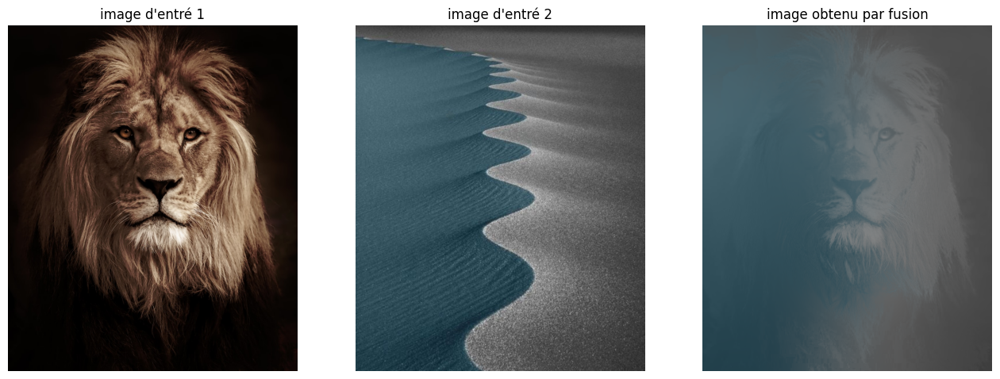

In [ ]:
ima5=imread('/content/3.jpg')
show_filter(ima2,ima5,r=150,eps=0)

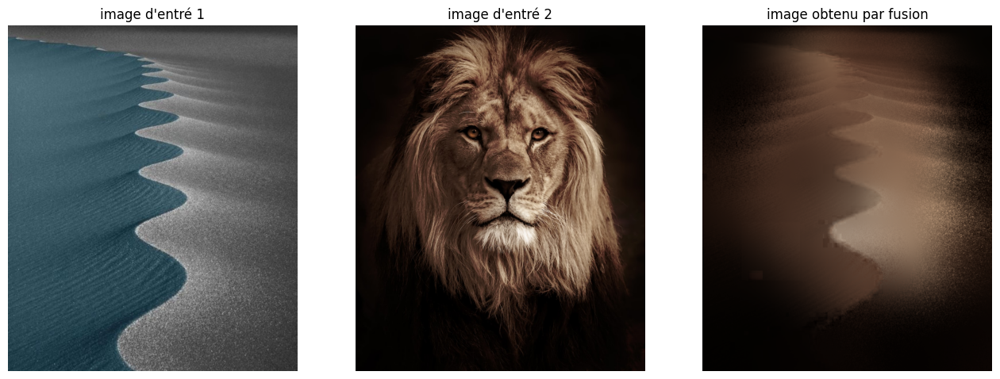

In [ ]:
show_filter(ima5,ima2,r=100,eps=0.00000002)

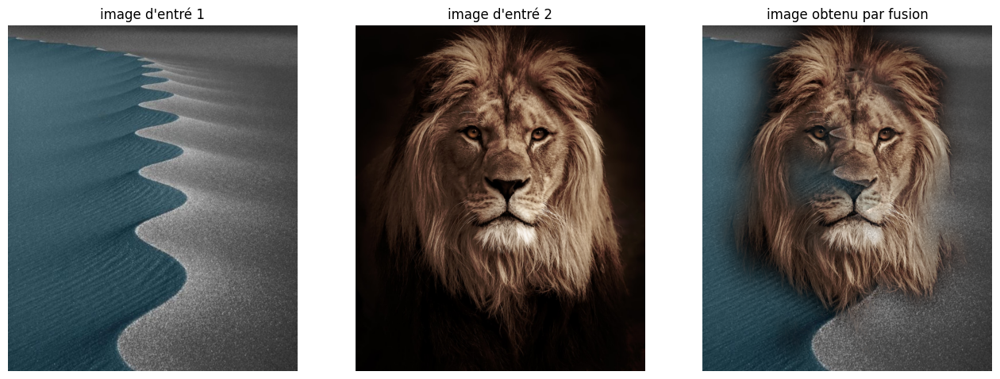

In [ ]:
show_fusion(ima5,ima2)

<ipython-input-66-d327a5aad633>:43: RuntimeWarning: invalid value encountered in divide
  D_hat = sum([W_D[i]*D[i] for i in range(n)]) / sum(W_D)


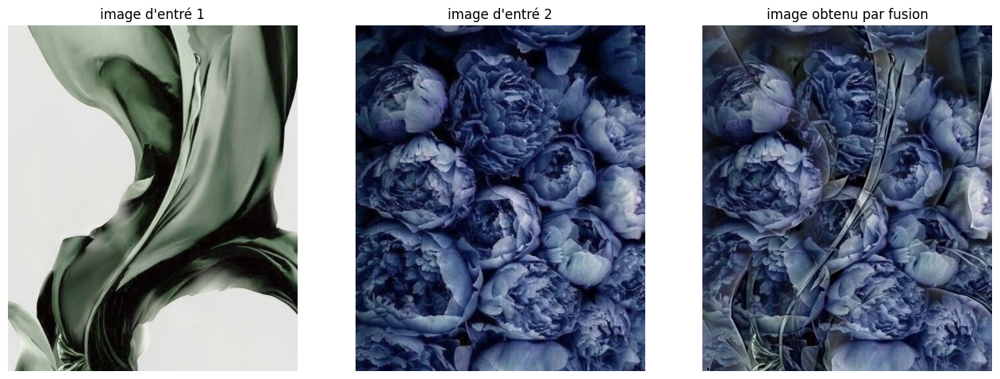

In [ ]:
ima6=imread("5.jpg")
show_fusion(ima3,ima4)

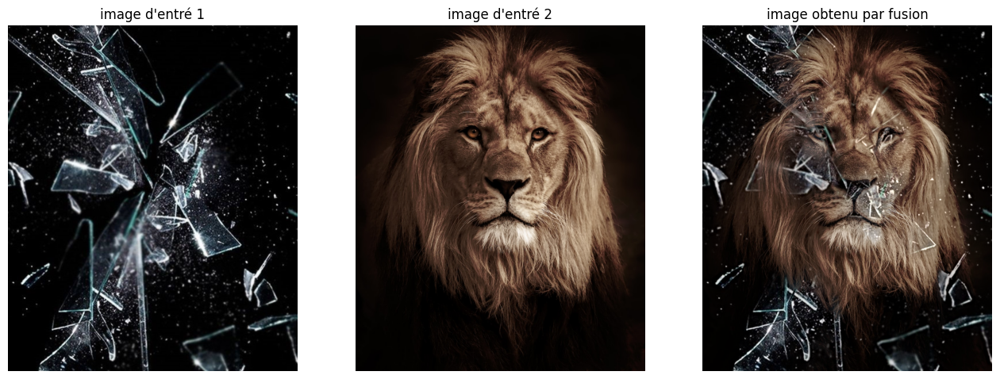

In [ ]:
ima7=imread("/content/shattered #NMrevolution.jpg")
show_fusion(ima7,ima2)

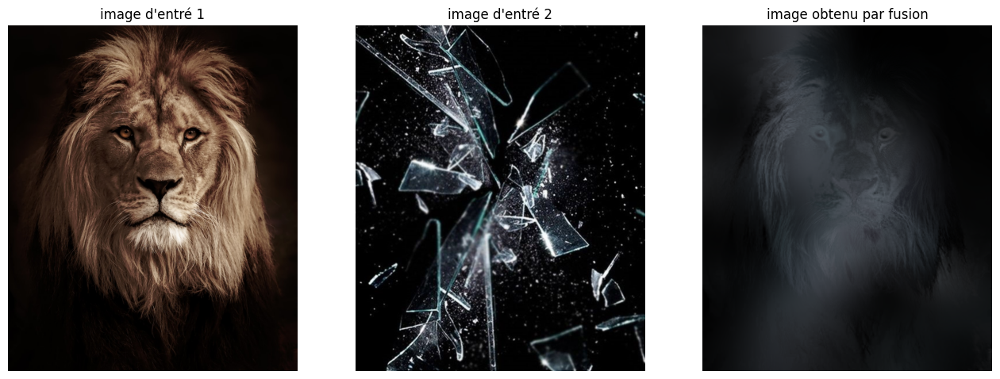

In [ ]:
show_filter(ima2,ima7,100,0.00002)

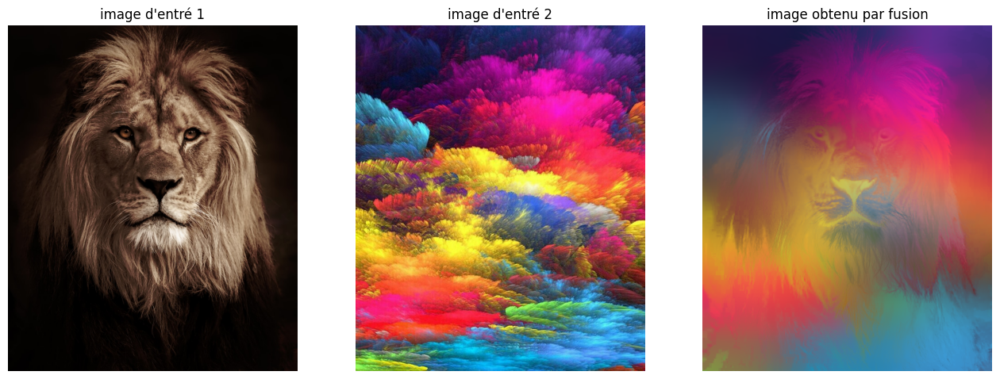

In [ ]:
ima8=imread("/content/téléchargement (3).jpg")
show_filter(ima2,ima8,100,0.00002)

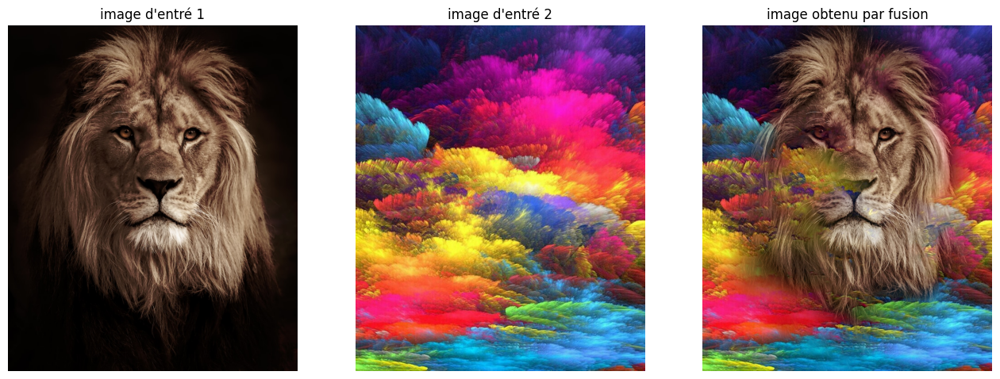

In [ ]:
show_fusion(ima2,ima8)

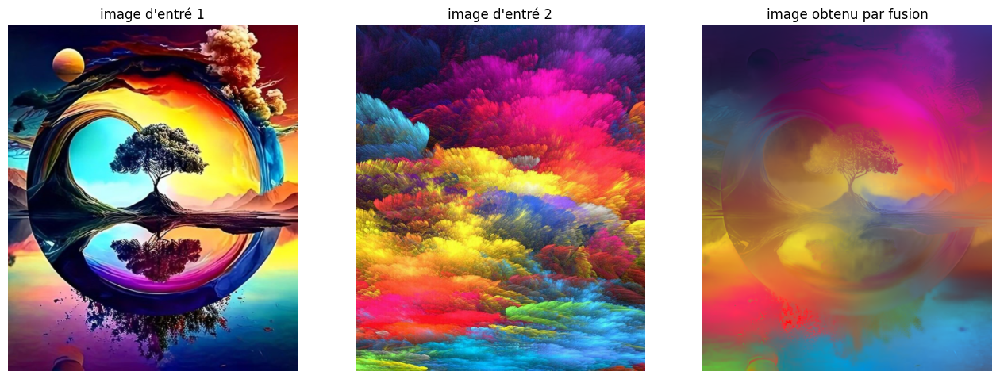

In [ ]:
ima9=imread("/content/7.jpg")
show_filter(ima9,ima8,100,0.00002)

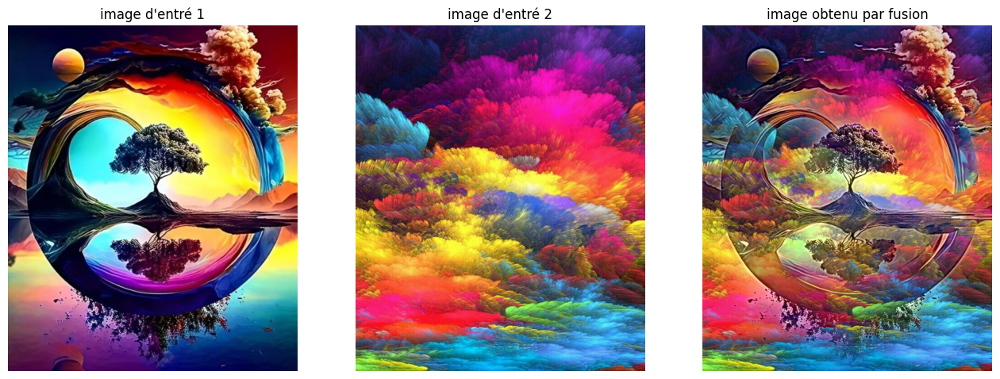

In [ ]:
show_fusion(ima9,ima8)

In [ ]:
imsave("results.png",(255*guided_filter_fusion((ima7,ima2,ima8,ima9,ima3,ima4))).astype(np.uint8))

<ipython-input-66-d327a5aad633>:43: RuntimeWarning: invalid value encountered in divide
  D_hat = sum([W_D[i]*D[i] for i in range(n)]) / sum(W_D)


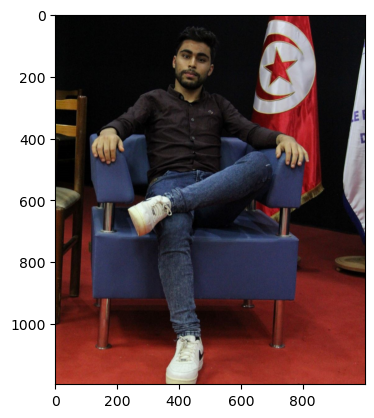

In [19]:
ima1=imread("kais.jpg")
plt.imshow(ima1)

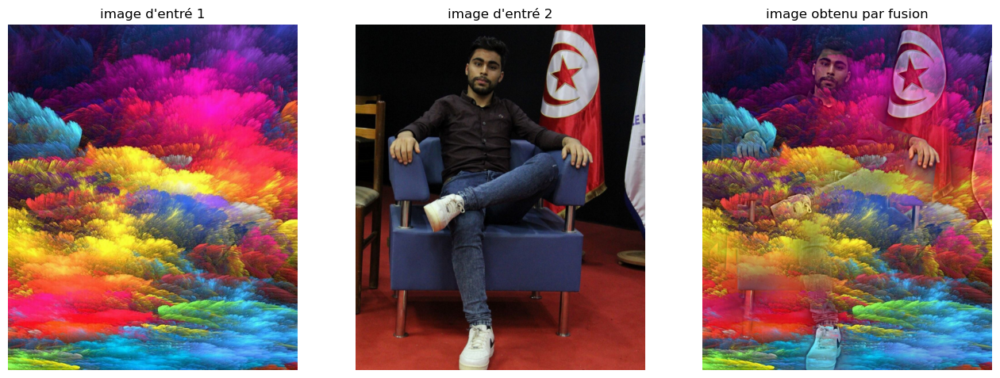

In [20]:
ima2=imread("téléchargement (3).jpg")
show_fusion(ima2,ima1)